# **Working with GroqVisionModel**

### **Introduction:**  
Groq provides a suite of high-performance vision models optimized for speed, accuracy, and scalability, enabling advanced computer vision tasks. Groq's models, including cutting-edge architectures for object detection, image classification, and segmentation, are designed for developers and data scientists who need robust, low-latency solutions for real-time vision applications.  

This notebook will guide users through setting up and utilizing **GroqVisionModel** within **Swarmauri** for a variety of use cases.

---

This notebook will:  

- Introduce the setup and initialization of **GroqVisionModel** within **Swarmauri**.  
- Demonstrate **synchronous image prediction**, **asynchronous processing**, and **batch prediction** for multiple images.   

By the end of this notebook, you will have a comprehensive understanding of how to use **GroqVisionModel** to process and analyze visual data efficiently, making it an invaluable tool for real-time vision tasks across industries such as healthcare, security, and autonomous systems.  

# **Setup and Configuration**

## Import the GroqVision class and othe necessary classes

In [6]:
from swarmauri.llms.concrete.GroqVisionModel import GroqVisionModel
from swarmauri.conversations.concrete.Conversation import Conversation # For handling conversation logic and flow
from swarmauri.messages.concrete.HumanMessage import HumanMessage # For adding user input or human messages

### Load your API KEY from your environment variables
- Make sure you have python-dotenv installed if not, run `pip install python-dotenv` so you can install it.
- Get your API KEY [HERE](https://console.groq.com/keys)

In [3]:
import os
from dotenv import load_dotenv
load_dotenv()

GROQ_API_KEY = os.getenv("GROQ_API_KEY")

### Initialize GroqVisionModel
- Note: You can as well input your api key directly, but it's better to load from .`env` file
- Also, the `name` arguments is an optional argument that allows you to input a model from the list of allowed_models.

In [4]:
model = GroqVisionModel(api_key=GROQ_API_KEY, name="llama-3.2-11b-vision-preview")

### **Simple Example Using the `predict` Method**

The `predict` method in **GroqVisionModel** allows users to interact with images by providing a URL to the image and a prompt describing the task or question. The method processes the input and returns a response based on the prompt, enabling powerful vision-based applications.


Note:To display the image directly in this Jupyter notebook, we’ll use the utility function `img_url_to_in_memory_img` from `swarmauri.utils`, which converts the image URL into an in-memory image for visualization.

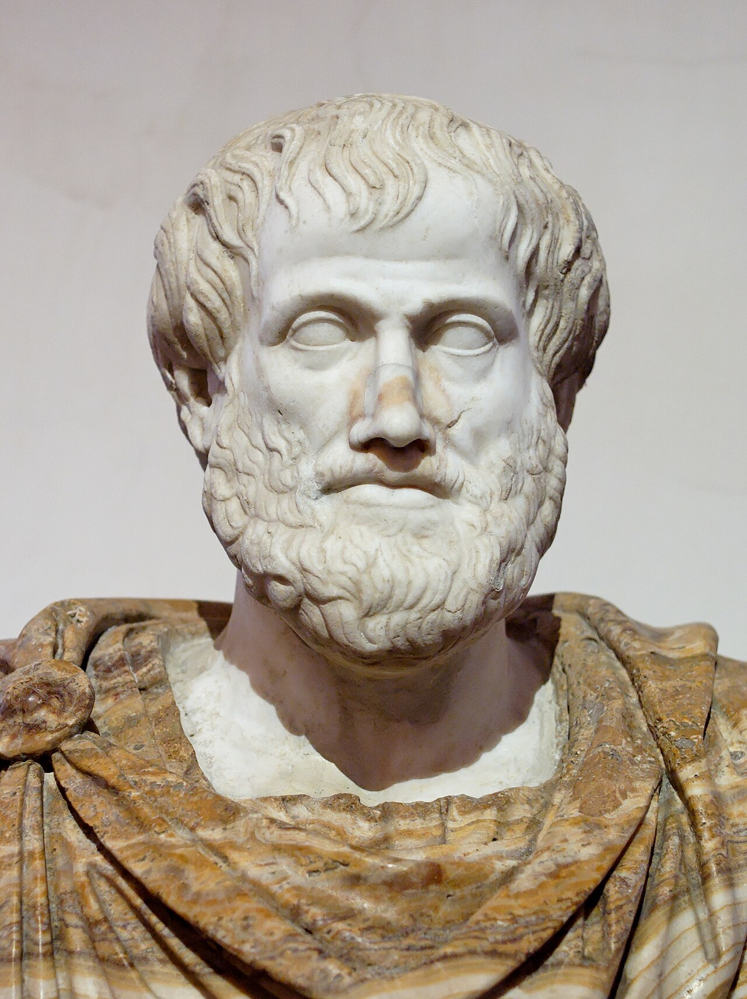

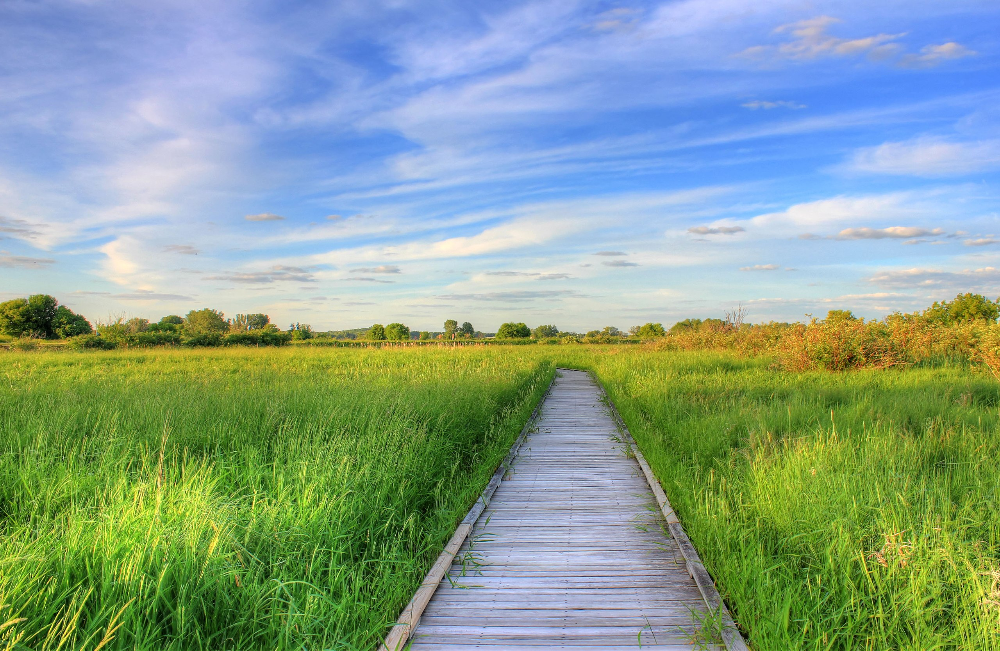

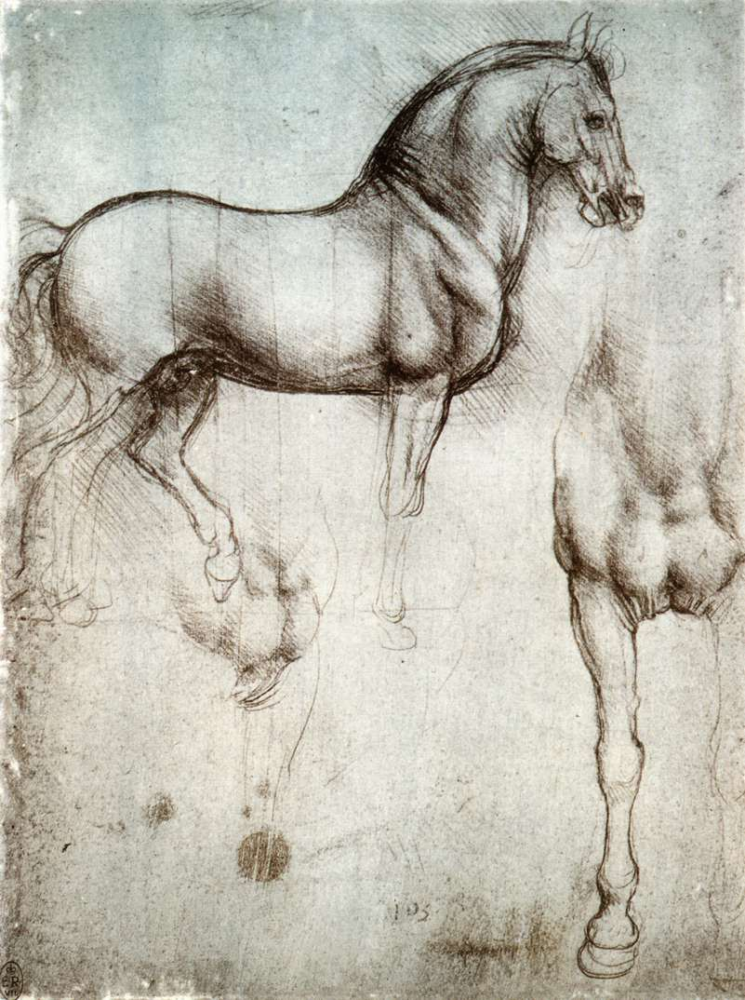

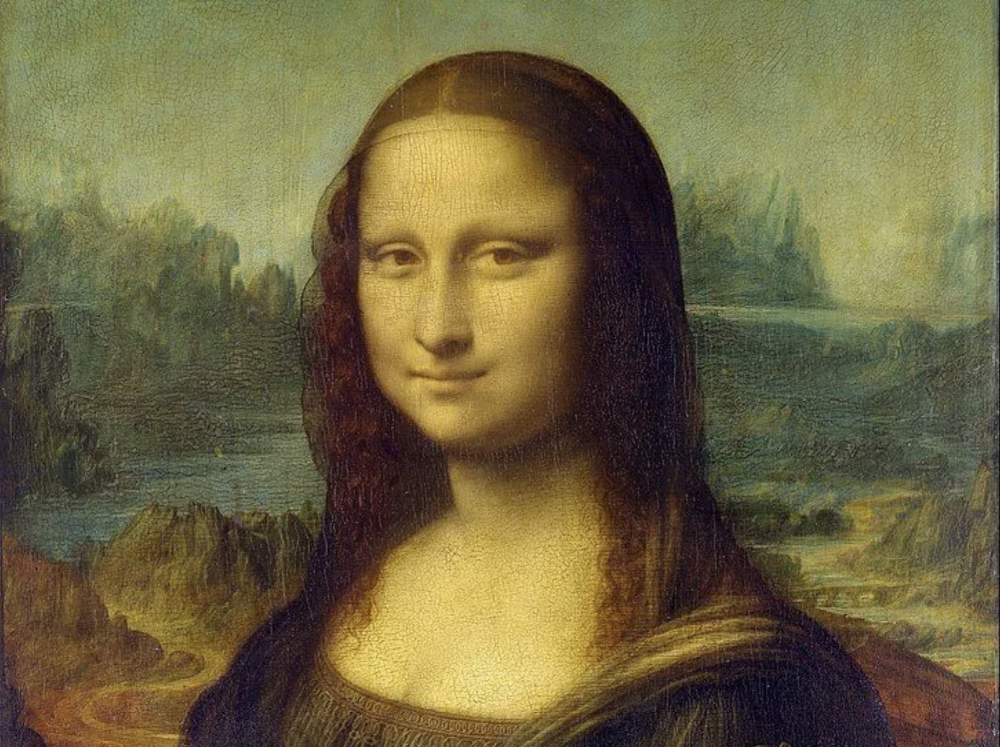

In [28]:
from swarmauri.utils.img_url_to_in_memory_img import img_url_to_in_memory_img
from IPython.display import display

image1_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/a/ae/Aristotle_Altemps_Inv8575.jpg/1280px-Aristotle_Altemps_Inv8575.jpg"
image2_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/dd/Gfp-wisconsin-madison-the-nature-boardwalk.jpg/2560px-Gfp-wisconsin-madison-the-nature-boardwalk.jpg"
image3_url = "https://upload.wikimedia.org/wikipedia/commons/5/54/Study_of_horse.jpg"
image4_url = "https://llava-vl.github.io/static/images/monalisa.jpg"

image_list = [image1_url, image2_url, image3_url, image4_url]

for image in image_list:
    actual_image = img_url_to_in_memory_img(image)
    display(actual_image)

We have successfuly seen the images in the above url using the `img_url_to_in_memory_img function` in `swarmauri/utils`
We will now use the `predict` method to see what the model has to say about the first image

In [25]:
# Define the input data
input_data = [
    {"type": "text", "text": "who is in this picture and what do you know about him?"},
    {
        "type": "image_url",
        "image_url": {
            "url": image1_url,
        },
    },
]

In [26]:
# Create a conversation and add input messages
conversation = Conversation()
human_message = HumanMessage(content=input_data)
conversation.add_message(human_message)

In [27]:
# Predict using the GroqVisionModel
model.predict(conversation=conversation)

# Get the prediction 
prediction = conversation.get_last().content
print(prediction)

The image is a bust of Aristotle, a renowned Greek philosopher and polymath. He was born in 384 BCE in Stagira, a city in ancient Macedonia, and died in 322 BCE in Chalcis, Euboea, at the age of 62. Aristotle was a student of Plato and tutored Alexander the Great. He made significant contributions to various fields, including philosophy, science, ethics, politics, and logic. His works include "Nicomachean Ethics," "Politics," and "Posterior Analytics." Aristotle's ideas have had a profound impact on Western philosophy and continue to influence contemporary thought.


As you can see, the model was able to give an accurate answer

**You can also use the Asynchronous version of the `predict` method.** 
**The `apredict` method allows you to asynchronously process an image.**

In [ ]:
result = await model.apredict(conversation=conversation)
prediction = result.get_last().content

## Generating batch answers 

To send the questions and images in batches and generate the answer, you can use the `batch` method

In [29]:
prompts = [
    "who is in this picture and what do you know about him??",
    "What kind of vibe does this picture give?.",
    "What do you know about this picture?",
    "Who drew this picture and what is it known for",
]

In [30]:
# Create conversations for the batch
conversations = []
for image_url, prompt in zip(image_list, prompts):
    conversation = Conversation()
    input_data = [
        {"type": "text", "text": prompt},
        {"type": "image_url", "image_url": {"url": image_url}},
    ]
    human_message = HumanMessage(content=input_data)
    conversation.add_message(human_message)
    conversations.append(conversation)

In [32]:
# Use the batch method to process all conversations
results = model.batch(conversations=conversations)

# Print the predictions for each conversation
for idx, result in enumerate(results):
    prediction = result.get_last().content
    print(f"Conversation {idx + 1}:")
    print(f"Image URL: {image_list[idx]}")
    print(f"Prompt: {prompts[idx]}")
    print("Prediction:", prediction)

Conversation 1:
Image URL: https://upload.wikimedia.org/wikipedia/commons/thumb/a/ae/Aristotle_Altemps_Inv8575.jpg/1280px-Aristotle_Altemps_Inv8575.jpg
Prompt: who is in this picture and what do you know about him??
Prediction: The picture shows a bust of Aristotle, a renowned ancient Greek philosopher. Key aspects of his life and contributions include:

* **Birth and Education**: Born in 384 BCE in Stagira, a small town in northern Greece, into a family of physicians. His father, Nicomachus, was the personal physician to King Amyntas III of Macedon. Aristotle received his early education in Plato's Academy in Athens, where he studied philosophy and mathematics.

* **Influences and Philosophy**: Aristotle's philosophy was heavily influenced by Plato, but he eventually developed his own distinct theories. He believed in the concept of hylomorphism, which posits that reality consists of matter and form. He also developed the concept of telos, or purpose, and argued that everything has a 

For asynchronous batch processing, you can use `abacth` method.
Check the code below for an example on how to use it

In [ ]:
results = await model.abatch(conversations=conversations)

#### **You can as well stream the response using the `stream` method for synchronous streaming and `astream` for asynchronous streaming.**

With this, we have come to the end of the Vision Tutorial, feel free to explore beyond what we covered in this notebook.
If you can think of it or imagine it, you can surely build it with swarmauri.

Stay with us as we dive into the Audio Gneration classes and finally wrap the course up with some amazing projects 

In [35]:
from swarmauri.utils import print_notebook_metadata

metadata = print_notebook_metadata.print_notebook_metadata("Victory Nnaji", "3rd-Son")
print(metadata)

Author: Victory Nnaji
GitHub Username: 3rd-Son
Notebook File: Notebook_03_Working_with_GroqVisonModel.ipynb
Last Modified: 2024-12-30 07:48:27.525867
Platform: Darwin 24.1.0
Python Version: 3.11.11 (main, Dec 11 2024, 10:25:04) [Clang 14.0.6 ]
Swarmauri Version: 0.5.2
None
